# Imports

In [1]:
from typing import Any, Optional, Tuple, List
from numpy import float64
from PIL import Image
import graphviz
import pandas as pd
import IPython.display
from IPython.display import display, Image
import folium
%pip install PyMuPDF
import fitz  # Importa la biblioteca PyMuPDF
from PIL import Image


Note: you may need to restart the kernel to use updated packages.


# Clases

In [2]:
class Queue:

    def __init__(self, size: int) -> None:
        self.queue: List[Any] = []
        self.size = 1000

    def __repr__(self) -> str:
        return str(self.queue)
# Agrega un elemento a la cola
    def add(self, elem: Any) -> None:
        if len(self.queue) >= self.size:
            raise ValueError('The Queue is full')
        self.queue.append(elem)
# Elimina y devuelve el elemento mas antiguo de la cola
    def remove(self) -> Any:
        if not self.queue:
            raise ValueError('The Queue is empty')
        return self.queue.pop(0)
# Comprueba si la cola esta vacia
    def is_empty(self) -> bool:
        return len(self.queue) == 0

In [3]:
class Node:
# Se utiliza para inicializar un nuevo nodo con un valor especifico
    def __init__(self, data:'Property') -> None:
        self.data = data
        self.left: Optional["Node"] = None
        self.right: Optional["Node"] = None
        self.level = None
# Devuelve los nodos
    def __repr__(self) -> str:
        left = self.left.data if self.left is not None else None
        right = self.right.data if self.right is not None else None
        return f'{self.data} {left} {right}'

In [4]:
class Arbol_AVL:
# Inicializa el nuevo árbol AVL con una raiz vacía
    def __init__(self) -> None:
        self.root: Optional["Node"] = None
# A partir de un nodo dado y sus respectivas métricas asigna niveles a los nodos del árbol
# De la misma forma recorre el árbol desde la raiz hasta encontrar el nodo con las métricas propuestas para el nodo
    def put_levels(self, nodo:'Property') -> bool:
        nivel = 0
        p = self.root
        while p is not None:
            nivel +=1
            if nodo.metric == p.data.metric:
                if nodo.metric2 == p.data.metric2:
                    p.level = nivel
                    return True
                elif nodo.metric2 < p.data.metric2:
                    p = p.left
                else:
                    p = p.right
            else:
                if nodo.metric < p.data.metric:
                    p = p.left
                else:
                    p = p.right
        return False
# Función para buscar un elemento y para devolver el nodo que lo contiene con su respectivo nodo padre, en caso de existir
    def search(self, elem: 'Property') -> Tuple[Optional["Node"], Optional["Node"]]:
        p, pad = self.root, None
        if(isinstance(elem, float) or isinstance(elem, int)):

            while p is not None:
                if elem == p.data.metric:

                    return p, pad
                else:
                    pad = p
                    if elem < p.data.metric:
                        p = p.left
                    else:
                        p = p.right
        else:
            while p is not None:
                if elem.metric == p.data.metric:
                    return p, pad
                else:
                    pad = p
                    if elem.metric < p.data.metric:
                        p = p.left
                    else:
                        p = p.right
        return p, pad
# Función que busca en el árbol un elemento y devuelve la informacion de su respectivo duplicado,
# el cual indica donde deberá insertarse en caso de estar duplicado.
    def __search_dupli(self, elem: 'Property',node:'Node'= None) -> Tuple[Optional["Node"], Optional["Node"]]:
        if node is None:
            node = self.root
        p, pad = node, None
        while p is not None:
            pad = p
            if elem.metric == p.data.metric:
                if elem.metric2 > p.data.metric2:
                    p = p.right
                    bol = True
                elif (elem.metric2 < p.data.metric2):
                    p = p.left
                    bol = False
                else:
                    if(elem.title == p.data.title and elem.price == p.data.price and elem.surface_total == p.data.surface_total):
                        raise ValueError("Ya hay un nodo con esa informacion")
            else:
                if elem.metric < p.data.metric:
                    p = p.left
                    bol = False
                else:
                    p = p.right
                    bol = True
        return bol, pad
# Busca un nodo con la métrica especificada y devuelve el nodo con su respectivo padre, en caso de existir
# De la misma forma si se encuentra el nodo que se especificó con la métrica, llama a la función search_all para buscar todos los nodos con la misma métrica que se especifica anteriormente
# En caso de que no se encuentre el nodo con la métrica especificada, aparecera un mensaje en consola que indique no se ha encontrado un nodo con esos valores
    def search_metric(self, elem: float64) -> Tuple[Optional["Node"], Optional["Node"]]:
        p, aux = self.root, None
        while p is not None:
            if elem == p.data.metric:
                aux = p
                p = None
                #return p
            else:
                pad = p
                if elem < p.data.metric:
                    p = p.left
                else:
                    p = p.right
        if(aux is not None):
            self.search_all(aux.data)
        else:
            print("No se ha encontrado nodo con esos valores")
#Función de proporciona el nivel, factor de eleibriom, nodo padre, nodo abuelo y nodo tio de un nodo en especifico del árbol
    def search_all(self, elem:'Property', mode=1):
        p, pad = self.search(elem)
        if pad is not None:
            pad, abuelo = self.search(pad.data)
            if abuelo is not None:
                if(abuelo.left == pad):
                    tio = abuelo.right
                else:
                    tio = abuelo.left
                if(mode==1):
                    aux = [p.data,pad.data,tio.data,abuelo.data]
                    map = self.mostrar_geolocalizacion_mapa(aux,2)
                    display(map)
            else:
                tio= None
        else:
            abuelo = None
            tio = None
        factor_b = self.balance_factor(p)
        return p, p.level, factor_b, pad, abuelo, tio
# Función para insertar un nuevo nodo en el árbol, en caso de que el árbol este vacio, el nuevo dato a insertar se convertira en la raiz del árbol
# De la misma forma verifica y corrife los factores de equilibrio del árbol
    def insert(self, elem: 'Property') -> bool:
        to_insert = Node(elem)
        if self.root is None:
            self.root = to_insert
            return True
        else:
            bol, pad = self.__search_dupli(elem, self.root)
            if bol:
                pad.right = to_insert
            else:
                pad.left = to_insert
            self.desbalance()
            return False

# Función para eleminar un elemento, válido según el sucesor o predecesor
# Al final se vuelve a verificar y corregir los factores de equilibrio en caso de que exista un desbalanceo
    def delete(self, elem: Any, mode: bool = True) -> bool:
        if isinstance(elem, Property):
            elem = elem.metric
        if elem is Property:
            elem = elem.metric
        p, pad = self.search(elem)

        if p is not None:
            if p.left is None and p.right is None:
                if p == pad.left:
                    pad.left = None
                else:
                    pad.right = None
                del p
            elif p.left is None and p.right is not None:
                if p == pad.left:
                    pad.left = p.right
                else:
                    pad.right = p.right
                del p
            elif p.left is not None and p.right is None:
                if p == pad.left:
                    pad.left = p.left
                else:
                    pad.right = p.left
                del p
            else:
                if mode:
                    pred, pad_pred = self.__pred(p)
                    p.data = pred.data
                    if pred.left is not None:
                        if pad_pred==p:
                           p.left = pred.left
                        else:
                            pad_pred.right = pred.left
                    else:
                        pad_pred.right = None
                    del pred
                else:
                    sus, pad_sus = self.__sus(p)
                    p.data = sus.data
                    if sus.right is not None:
                        pad_sus.left = sus.right
                    else:
                        pad_sus.left = None
                    del sus
        else:
            print("No se ha eliminado nada, debido a que no hay ningun nodo con ese valor")
        self.desbalance()
# Función del predecesor que se usa para la función de delete
    def __pred(self, node: "Node") -> Tuple["Node", "Node"]:
        p, pad = node.left, node
        while p.right is not None:
            p, pad = p.right, p

        return p, pad
# Función del sucesor que se usa para la función de delete
    def __sus(self, node: "Node") -> Tuple["Node", "Node"]:
        p, pad = node.right, node
        while p.left is not None:
            p, pad = p.left, p

        return p, pad

    def preorder(self,node: Optional["Node"]) -> None:
        if node is not None:
            print(node.data, end=' ')
            self.preorder(node.left)
            self.preorder(node.right)

    def __inorder(self, node: Optional["Node"]) -> None:
        if node is not None:
            self.__inorder(node.left)
            print(node)
            self.__inorder(node.right)

    def inorder(self) -> None:
        self.__inorder(self.root)
# Función para calcular la altura del subárbol en función de un nodo
    def tree_height(self, Node_I) -> int:
        if isinstance(Node, int):
            Node_I = self.search(Node_I)[0]
        if isinstance(Node_I,Property):
            Node_I = self.search(Node_I)[0]
        if Node_I is None:
            return -1
        max_height = -1
        level = 0
        queue = [(Node_I, level)]
        while queue:
            node, current_level = queue.pop(0)
            if node is not None:
                max_height = max(max_height, current_level)
                queue.append((node.left, current_level + 1))
                queue.append((node.right, current_level + 1))
        return max_height
# Función para calcular el factor de equilibrio de un nodo
    def balance_factor(self, node: "Node") -> int:
        if isinstance(node,int):
            node = self.search(node)[0]
        if isinstance(node,Property):
            node = self.search(node)[0]
        left_height = self.tree_height(node.left)
        right_height = self.tree_height(node.right)
        return right_height-left_height

    def levels_nr_print(self, node: "Node"= None) -> None:
        if node is None:
            node = self.root
        p, q = node, Queue(50)
        nodos = []
        q.add(p)
        while not q.is_empty():
            p = q.remove()
            nodos.append(p.data)
            print(p.data, p.level , end=' ')
            if p.left is not None:
                q.add(p.left)
            if p.right is not None:
                q.add(p.right)

    def levels_nr(self, node: "Node" = None) -> None:
        if(node is None):
            node = self.root
        p, q = node, Queue(50)
        nodos = []
        q.add(p)
        while not q.is_empty():
            p = q.remove()
            p.data.familia = ""
            nodos.append(p.data)
            if p.left is not None:
                q.add(p.left)
            if p.right is not None:
                q.add(p.right)
        return nodos
# Función que verifica que exista un equilibrio en cada nodo en el árbol, en caso de que exista un desbalanceo ese nodo que lo provoca
# se agrega a una lista auxiliar y se llama a la función balanceo para equilibrarlo y luego lo devuelve equilibrado
    def desbalance(self) -> 'Node':
        dic, aux = {}, []
        nodos: 'Node'= self.levels_nr(self.root)
        for elem in nodos:
            dic[elem]= self.balance_factor(elem)
            self.put_levels(elem)
            if dic[elem] > 1 or dic[elem] < -1:
                aux.append(elem)
        if len(aux)>0:
            self.balanceo(aux[-1],dic[aux[-1]])
# Función que balancea realizando operaciones de rotación para equilibrar un nodo desbalanceado
# Si el factor de equilibrio es mayor a 1, se realiza una rotación simple izquierda o doble izquierda-derecha
# Si el factor de equilibrio es menor a 1, se realiza un rotación simple derecha o doble derecha-izquierda
    def balanceo(self, node, equi):
        if isinstance(node, int):
            node = self.search(node)[0]
        if isinstance(node, Property):
            node = self.search(node)[0]
        if equi>1:
            if self.balance_factor(node.right)>=0:
                node = self.rotacion_Sim_Iz(node)
            else:
                aux= node
                node = self.rotacion_Sim_De(node.right)
                node = self.rotacion_Sim_Iz(aux)
        else:
            if self.balance_factor(node.left)<=0:
                node = self.rotacion_Sim_De(node)
            else:
                aux = node
                node = self.rotacion_Sim_Iz(node.left)
                node = self.rotacion_Sim_De(aux)
#  Si es 2 rotación a la izquierda, entonces -2 rotación a la derecha
#  signos iguales rotación simple, signos contrarios rotación doble
    def rotacion_Sim_Iz(self, nodo:'Node'):
        if isinstance(nodo,int):
            nodo = self.search(nodo)[0]
        if isinstance(nodo,Property):
            nodo = self.search(nodo)[0]
        padre = self.search(nodo.data)[1]
        aux = nodo.right
        nodo.right = aux.left
        aux.left = nodo
        if self.root.data == nodo.data:
            self.root = aux
        else:
            if padre.data.metric > nodo.data.metric:
                padre.left= aux
            else:
                padre.right = aux
        return aux

    def rotacion_Sim_De(self, nodo:'Node'):
        if isinstance(nodo,int):
            nodo = self.search(nodo)[0]
        if isinstance(nodo,Property):
            nodo = self.search(nodo)[0]
        padre = self.search(nodo.data)[1]
        aux= nodo.left
        nodo.left= aux.right
        aux.right=nodo
        if self.root.data == nodo.data:
            self.root = aux
        else:
            if padre.data.metric > nodo.data.metric:
                padre.left= aux
            else:
                padre.right = aux
        return aux

    def integer_to_dms(self, integer_value):
        degrees = int(integer_value)

        fractional_part = abs(integer_value - degrees)

        minutes = int(fractional_part * 60)

        seconds = (fractional_part * 60 - minutes) * 60
        degrees = f"{degrees}° {minutes}' {seconds:.2f}\""
        return degrees

    def Mostrar_arbol(self,nombre:str):
        # Ruta al archivo PDF que deseas mostrar
        ruta_pdf = nombre + ".pdf"

        documento = fitz.open(ruta_pdf)

        # Carga la página del PDF (supongamos que es la primera página, índice 0)
        pagina = documento.load_page(0)

        imagen = pagina.get_pixmap()  # Convierte la página en una imagen

        # Muestra la imagen en Colab
        imagen_pil = Image.frombytes('RGB', [imagen.width, imagen.height], imagen.samples)
        display(imagen_pil)

        documento.close()  # Se cierra el archivo pdf


    def graficar_arbol(self, name: str="arbol_properties", nodo=None):
        if (nodo is None):
            nodo = self.root
        grafo = self.__graficar_arbol(nodo)
        grafo.render(name, view=True)
        self.Mostrar_arbol(name)

    def __graficar_arbol(self, nodo:"Node", grafo=None):
        if grafo is None:
            grafo = graphviz.Digraph(format='pdf')
        if nodo is not None:
            etiqueta = f"—{nodo.data.metric2}—\n{str(nodo.data.city)}\nLatitud: {self.integer_to_dms(nodo.data.latitude)}\nLongitud: {self.integer_to_dms(nodo.data.longitude)}\n"
            etiqueta+= f"Precio: ${str(int(nodo.data.price))}\nSuperficie Total: {str(int(nodo.data.surface_total))}m²\n Métrica: {str(int(nodo.data.metric))} \nFactor de Balanceo: {self.balance_factor(nodo)}"
            grafo.node(str(nodo.data.metric2), label= etiqueta, color='antiquewhite4', fontcolor='gray15', style='filled', fillcolor='beige', penwidth='3', fontname="Arial")
            if nodo.left is not None:
                grafo.edge(str(nodo.data.metric2), str(nodo.left.data.metric2), color='aquamarine3', penwidth='2')
                self.__graficar_arbol(nodo.left, grafo)
            if nodo.right is not None:
                grafo.edge(str(nodo.data.metric2), str(nodo.right.data.metric2), color='mediumslateblue', penwidth='2')
                self.__graficar_arbol(nodo.right, grafo)
        return grafo

    def niveles_recursivo(self):
        resultado = []
        arbol = self.root
        self.recorrer_niveles([arbol], resultado)
        n = 0
        for elemento in resultado:
            if elemento == '\n':
                print("\nNivel", n)
                n+=1
            else:
                print(elemento, end=' ')
        return None

    def recorrer_niveles(self, nodos, resultado):
        if not nodos:
            return
        siguiente_nivel = []
        nivel_actual = []
        for nodo in nodos:
            nivel_actual.append(nodo.data.metric2)
            if nodo.left:
                siguiente_nivel.append(nodo.left)
            if nodo.right:
                siguiente_nivel.append(nodo.right)
        resultado.append('\n')
        resultado.extend(nivel_actual)
        self.recorrer_niveles(siguiente_nivel, resultado)
#  Función de filtrado, para la búsqueda de propiedades en específico
    def __buscar_criterios(self, filtro, condi: list, nodo: list['Property']):
        attribute_mapping = {
            1: 'title',
            2: 'department',
            3: 'city',
            4: 'property_type',
            5: 'latitude',
            6: 'longitude',
            7: 'surface_total',
            8: 'surface_covered',
            9: 'bedrooms',
            10: 'bathrooms',
            11: 'operation_type',
            12: 'price',
            13: 'metric'}
        aux = []
        if filtro in attribute_mapping:
            attribute = attribute_mapping[filtro]
            operator = condi[1]
            value = condi[0]
            for elem in nodo:
                attr_value = getattr(elem, attribute)
                if operator == "=" and attr_value == value:
                    aux.append(elem)
                elif operator == "!=" and attr_value != value:
                    aux.append(elem)
                elif operator == ">" and attr_value > value:
                    aux.append(elem)
                elif operator == "<" and attr_value < value:
                    aux.append(elem)
                elif operator == ">=" and attr_value >= value:
                    aux.append(elem)
                elif operator == "<=" and attr_value <= value:
                    aux.append(elem)
                elif operator == "≥" and attr_value >= value:
                    aux.append(elem)
                elif operator == "≤" and attr_value <= value:
                    aux.append(elem)
        return aux
# Función que busca que se cumplan los criterios de filtrado, máximo 3 criterios
    def buscar_criterios(self, condi1:list, filtro1, condi2:list=None, filtro2=None, condi3:list=None, filtro3=None):
        auxi = []
        if condi1 is not None:
            auxi = self.__buscar_criterios(filtro1, condi1, self.levels_nr(self.root))
        if condi2 is not None:
            auxi = self.__buscar_criterios(filtro2, condi2, auxi)
        if condi3 is not None:
            auxi = self.__buscar_criterios(filtro3, condi3, auxi)
        padre, tio, abuelo, crite = [], [], [], []
        for i, elem in enumerate(auxi):
            elem.familia += "Original\t"
            crite.append(self.search_all(elem, 2)[0])
            padre.append(self.search_all(elem, 2)[3])
            if padre[i] is not None:
                padre[i].data.familia += f"Padre de {elem.metric2}.\t"
            tio.append(self.search_all(elem, 2)[4])
            if tio[i] is not None:
                tio[i].data.familia += f"Tio de {elem.metric2}.\t"
            abuelo.append(self.search_all(elem, 2)[5])
            if abuelo[i] is not None:
                abuelo[i].data.familia += f"Abuelo de {elem.metric2}.\t"
        repet = self.quitar_repeticiones([crite, padre, tio, abuelo])
        map = self.mostrar_geolocalizacion_mapa([auxi, repet[1], repet[2], repet[3]], 3)
        if map is not None:
            display(map)
        return auxi

    def quitar_repeticiones(self, lista:list):
        for i in range(len(lista)-1):
            for j in range(len(lista[i])):
                if lista[i+1][j] in lista[0]:
                    lista[i+1][j] = None
        return lista
# Bonificación, usando la biblioteca de Folium se muestra las ubicaciones geograficas en un mapa html
    def mostrar_geolocalizacion_mapa(self, nodos:list["Node"],mode=1):
        if mode==1:
            mapa = folium.Map(location=[nodos[0].latitude, nodos[0].longitude], zoom_start=13)
            colores = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'darkblue', 'darkgreen', 'pink', 'cadetblue'] * 25
            i = 0
            for elem in nodos:
                etiqueta = f"""_____{elem.metric2}_____<br>{str(elem.city)}<br>Latitud: {arbol.integer_to_dms(elem.latitude)}<br>
                Longitud: {arbol.integer_to_dms(elem.longitude)}<br>Precio: ${str(int(elem.price))}<br>Superficie Total: {str(int(elem.surface_total))}m²<br>"""
                folium.Marker([elem.latitude, elem.longitude], tooltip= f"{elem.metric2}", popup= etiqueta, icon=folium.Icon(color=colores[i]) ).add_to(mapa)
                i+=1

        elif mode ==2:
            mapa = folium.Map(location=[nodos[0].latitude, nodos[0].longitude], zoom_start=13)
            nombre = ["Original", "Padre", "Tio", "Abuelo"]
            colores = ['darkgreen', 'darkred', 'orange', 'cadetblue']
            for i, elem in enumerate(nodos):
                etiqueta = f"""_______{nombre[i]}_______<br>{elem.metric2}<br>{str(elem.city)}<br>Latitud: {arbol.integer_to_dms(elem.latitude)}<br>
                Longitud: {arbol.integer_to_dms(elem.longitude)}<br>Precio: ${str(int(elem.price))}<br>Superficie Total: {str(int(elem.surface_total))}m²<br> El nivel es {self.search(elem)[0].level}<br>Factor Balanceo: {self.balance_factor(elem)}"""
                folium.Marker([elem.latitude, elem.longitude], tooltip= nombre[i], popup= etiqueta, icon=folium.Icon(color=colores[i])).add_to(mapa)

        else:
            if len(nodos[0]) >= 1:
                mapa = folium.Map(location=[nodos[0][0].latitude, nodos[0][0].longitude], zoom_start=13)
                nombre = ["Original", "Padre", "Tio", "Abuelo"]
                colores = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'darkblue', 'darkgreen', 'pink', 'cadetblue'] * 25
                for i in range(len(nodos[0])):
                    etiqueta = f"""______{nodos[0][i].metric2.replace("-","")}______<br>{str(nodos[0][i].city)}<br>Latitud: {arbol.integer_to_dms(nodos[0][i].latitude)}<br>
                    Longitud: {arbol.integer_to_dms(nodos[0][i].longitude)}<br>Precio: ${str(int(nodos[0][i].price))}<br>Superficie Total: {str(int(nodos[0][i].surface_total))}m²<br>
                    Habitaciones: {str(int(nodos[0][i].bedrooms))}<br>Baños: {str(int(nodos[0][i].bathrooms))}<br> El nivel es {self.search(nodos[0][i])[0].level}<br>Factor Balanceo: {self.balance_factor(nodos[0][i])}"""
                    folium.Marker([nodos[0][i].latitude, nodos[0][i].longitude], tooltip= f"{nodos[0][i].familia}", popup= etiqueta, min_width=900, icon=folium.Icon(color=colores[i]),icon_size=(500, 500)).add_to(mapa)
                    if nodos[1][i] is not None:
                        etiqueta = f"""______{nodos[1][i].data.metric2.replace("-","")}______<br>{str(nodos[1][i].data.city)}<br>Latitud: {arbol.integer_to_dms(nodos[1][i].data.latitude)}<br>
                        Longitud: {arbol.integer_to_dms(nodos[1][i].data.longitude)}<br>Precio: ${str(int(nodos[1][i].data.price))}<br>Superficie Total: {str(int(nodos[1][i].data.surface_total))}m²<br>
                        Habitaciones: {str(int(nodos[1][i].data.bedrooms))}<br>Baños: {str(int(nodos[1][i].data.bathrooms))}<br> El nivel es {nodos[1][i].level}<br>Factor Balanceo: {self.balance_factor(nodos[1][i].data)}"""
                        folium.Marker([nodos[1][i].data.latitude, nodos[1][i].data.longitude],tooltip= f"{nodos[1][i].data.familia}", popup= etiqueta, min_width=900, icon=folium.Icon(color=colores[i]), icon_size=(200, 200)).add_to(mapa)
                        if nodos[3][i] is not None:
                            etiqueta = f"""______{nodos[3][i].data.metric2.replace("-","")}______<br>{str(nodos[3][i].data.city)}<br>Latitud: {arbol.integer_to_dms(nodos[3][i].data.latitude)}<br>
                            Longitud: {arbol.integer_to_dms(nodos[3][i].data.longitude)}<br>Precio: ${str(int(nodos[3][i].data.price))}<br>Superficie Total: {str(int(nodos[3][i].data.surface_total))}m²<br>
                            Habitaciones: {str(int(nodos[3][i].data.bedrooms))}<br>Baños: {str(int(nodos[3][i].data.bathrooms))}<br> El nivel es {nodos[3][i].level}<br>Factor Balanceo: {self.balance_factor(nodos[3][i].data)}"""
                            folium.Marker([nodos[3][i].data.latitude, nodos[3][i].data.longitude],tooltip= f"{nodos[3][i].data.familia}", popup= etiqueta, min_width=900, icon=folium.Icon(color=colores[i]), icon_size=(100, 100)).add_to(mapa)
                            if nodos[2][i] is not None:
                                etiqueta = f"""______{nodos[2][i].data.metric2.replace("-","")}______<br>{str(nodos[2][i].data.city)}<br>Latitud: {arbol.integer_to_dms(nodos[2][i].data.latitude)}<br>
                                Longitud: {arbol.integer_to_dms(nodos[2][i].data.longitude)}<br>Precio: ${str(int(nodos[2][i].data.price))}<br>Superficie Total: {str(int(nodos[2][i].data.surface_total))}m²<br>
                                Habitaciones: {str(int(nodos[2][i].data.bedrooms))}<br>Baños: {str(int(nodos[2][i].data.bathrooms))}<br> El nivel es {nodos[2][i].level}<br>Factor Balanceo: {self.balance_factor(nodos[2][i].data)}"""
                                folium.Marker([nodos[2][i].data.latitude, nodos[2][i].data.longitude],tooltip= f"{nodos[2][i].data.familia}", popup= etiqueta, min_width=900, icon=folium.Icon(color=colores[i]), icon_size=(100, 100)).add_to(mapa)
            else:
                print("No se ha encontrado informacion con estos criterios")
                return
        mapa.save('mapa2.html')
        return mapa

In [5]:
class Property:  # Clase para almacenar la información de cada propiedad

    def __init__(self, title:'str', department:'str', city:'str', property_type:'str', latitude:'float', longitude:'float', surface_total:'float',
                 surface_covered:'float', bedrooms:'int', bathrooms:'int', operation_type:'str', price: 'float') -> None:
        self.title = title
        self.department = department
        self.city = city
        self.property_type = property_type
        self.latitude = latitude
        self.longitude = longitude
        self.surface_total = surface_total
        self.surface_covered = surface_covered
        self.bedrooms = bedrooms
        self.bathrooms = bathrooms
        self.operation_type = operation_type
        self.price = price
        self.metric = self.price/ self.surface_total
        self.metric2 = self.title.split("Cod. ")[1]  # La métrica adicional es el código único de cada propiedad
        self.familia = ""

    def __str__(self) -> str:
        return f"{self.title.split('Cod. ')[1]}"
        # return f"{self.title} {self.department} {self.city} {self.property_type} {self.latitude} {self.longitude} {self.surface_total} {self.surface_covered} {self.bedrooms} {self.bathrooms} {self.operation_type} {self.price}"


#DataFrame

In [6]:
df = pd.read_csv('sample_data/co_properties_final.csv')
filas = []
for index, row in df.iterrows():
    filas.append(Property(row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7],row[8], row[9], row[10], row[11]))

C:\Users\Gow14\AppData\Local\Temp\ipykernel_23920\4216938661.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  filas.append(Property(row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7],row[8], row[9], row[10], row[11]))


# Pruebas

In [7]:
# Dataframe
df = pd.read_csv('sample_data/co_properties_final.csv')
df['metric'] = df['price'].divide(df['surface_total'])

arbol = Arbol_AVL()
aux= []
for index, row in df.iterrows():
    aux.append(Property(row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7],row[8], row[9], row[10], row[11]))
    arbol.insert(aux[index])

C:\Users\Gow14\AppData\Local\Temp\ipykernel_23920\2053556080.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  aux.append(Property(row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7],row[8], row[9], row[10], row[11]))


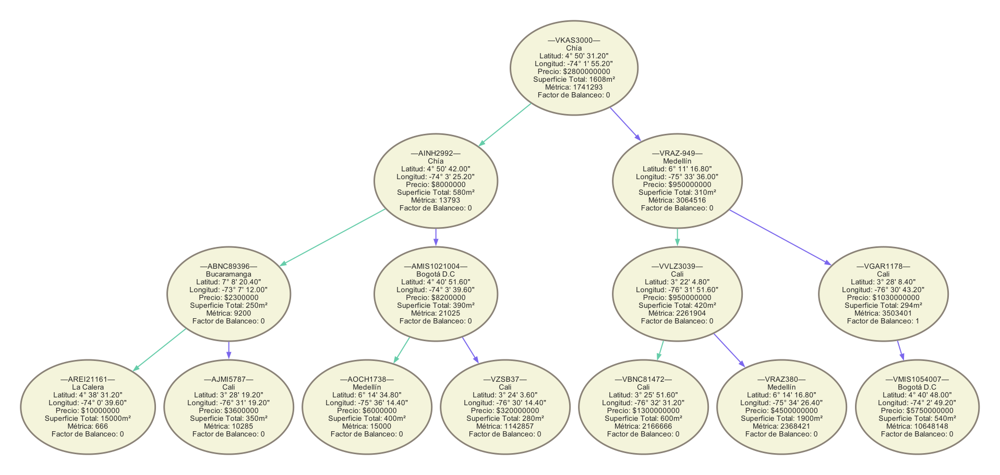

In [8]:
# Mostrar el árbol de los nodos que cumplen con los criterios de filtrado
arbol_criterios = Arbol_AVL()
criterios = arbol.buscar_criterios([4,">"], 9, [15000, ">="], 12, [200,">"], 7)
for data in criterios:
    arbol_criterios.insert(Property(data.title, data.department, data.city, data.property_type, data.latitude, data.longitude, data.surface_total, data.surface_covered, data.bedrooms, data.bathrooms, data.operation_type, data.price))
arbol_criterios.graficar_arbol("arbol_criterios")


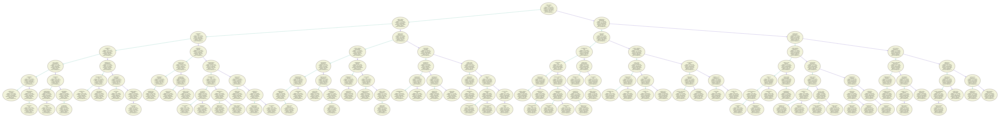

In [9]:
arbol.graficar_arbol()  # Se grafica el árbol completo
print("")

In [10]:
# Imprimir todas las columnas del dataframe
columns = df.columns.tolist()
for i, colum in enumerate(columns):
    print(f'{i+1}.  {colum.capitalize().replace("_", " ")}'
          if i < 9 else f'{i+1}. {colum.capitalize().replace("_", " ")}')

1.  Title
2.  Department
3.  City
4.  Property type
5.  Latitude
6.  Longitude
7.  Surface total
8.  Surface covered
9.  Bedrooms
10. Bathrooms
11. Operation type
12. Price
13. Metric


In [11]:
df['city'].value_counts()  # Se muestra la frecuencia de las ciudades

city
Cali             34
Bogotá D.C       33
Barranquilla     20
Medellín         20
Envigado          6
Chía              4
Bucaramanga       4
Sabaneta          3
Armenia           3
Jamundí           2
Santa Marta       2
Bello             2
La Calera         2
Buenaventura      2
Floridablanca     2
Barbosa           1
Cajicá            1
Fusagasugá        1
La Estrella       1
Marinilla         1
Rionegro          1
Ibagué            1
Sopó              1
Cartagena         1
Tabio             1
Mosquera          1
Name: count, dtype: int64

# Menu

##Opcion 1:  Insertar

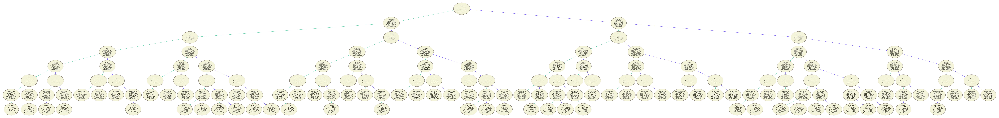

In [12]:
#@title Opcion 1
import re
patron = r'^\w+ Cod\. [A-Z]{4}-?\d{4,9}$'
patron = r'^.*? Cod\. [A-Z]{4}-?\d{4,9}$'
# Takes the options
Title  = "Apartamento En Arriendo En Cucuta Belen Cod. CCCA5892154" #@param {type: "string"}
Department = "Risaralda" # @param ["Cundinamarca", "Valle del Cauca", "Antioquia", "Atl\xE1ntico", "Santander", "Risaralda"] {allow-input: true}
City = "Pereira" # @param ["Cali", "Bogat\xE1 D.C", "Barranquilla", "Medell\xEDn", "Ch\xEDa", "Pereira"] {allow-input: true}
Property_type = "Apartamento" # @param ["Apartamento", "Casa", "Lote", "Finca", "Local comercial", "Otro"]
Latitude = 45 #@param {type: "number"}
Longitude = 24 #@param {type: "number"}
Total_surface = 50 #@param {type: "number"}
Covered_surface = 30 #@param {type: "number"}
Bedrooms = 10 # @param {type:"slider", min:0, max:10, step:1}
Bathrooms = 10 # @param {type:"slider", min:0, max:10, step:1}
Operation_type = "Venta" # @param ["Venta", "Arriendo"]
Price = 0 #@param {type: "number"}

if(Total_surface < Covered_surface):
    raise ValueError("Este es un valor incorrecto, Total_surface no puede ser menor que Covered_surface")
if(Total_surface < 0 ):
    raise ValueError(Total_surface," no puede ser negativo")
if(Covered_surface < 0 ):
    raise ValueError(Covered_surface," no puede ser negativo")
if(Price < 0 ):
    raise ValueError(Price," no puede ser negativo")
if re.match(patron, Title):
    print("")
else:
    raise ValueError(Title,"No cumple con el patron necesario ('Texto Cod. XXXX1234' o 'Texto Cod. XXXX-1234')")
if (Latitude  is not None and not isinstance(Latitude, str)) and (Longitude  is not None and not isinstance(Longitude, str)) and(Total_surface  is not None and not isinstance(Total_surface, str)) and(Covered_surface  is not None and not isinstance(Covered_surface, str)) and(Price  is not None and not isinstance(Price, str)) :
    nuevo = Property(Title,Department,City,Property_type,Latitude,Longitude,Total_surface,Covered_surface,Bedrooms,Bathrooms,Operation_type,Price)
    arbol.insert(nuevo)
    arbol.graficar_arbol('arbol_Ins')
else:
    print("Hay algun dato erroneo")

##Opcion 2:  Eliminar

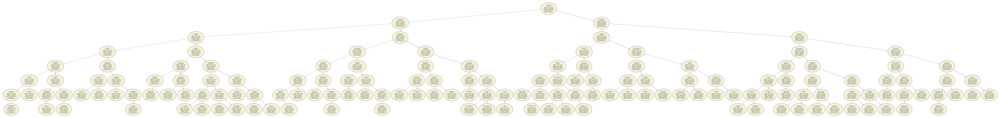

In [13]:
#@title Opcion 2

# Takes the options
precio = 800000 #@param {type: "number"}
superficie = 98 #@param {type: "number"}
metrica = precio / superficie

if metrica < 0 :
    raise ValueError(metrica," no puede tener un valor negativo.")
arbol.delete(metrica)
arbol.graficar_arbol('arbol_elim')
nodos = arbol.levels_nr()

##Opción 3: Buscar nodo según la métrica

In [14]:
#@title Opcion 3

# Takes the options
precio = 1187371 #@param {type: "number"}
superficie = 233 #@param {type: "number"}
metrica = precio / superficie

if metrica < 0:
    raise ValueError(metrica," no puede ser negativo.")
metrica = 11000000 /280
arbol.search_metric(metrica)

##Opcion 4:  Buscar segun criterios

—Restricciones:
No se permite  >  en  Property type

—Resultados de busqueda:
Categoria 1: (City = )
Categoria 2: (Bedrooms < 3.0)
Categoria 3: Vacio

Visualizacion del mapa:
No se ha encontrado informacion con estos criterios

Grafo correspondiente a los criterios proporcionados:


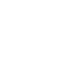

In [15]:
#@title Opcion 4

# Takes the options
categoria_1 = "City" # @param ["", "Title", "Department", "City", "Property type", "Latitude", "Longitude", "Total surface", "Covered surface", "Bedrooms", "Bathrooms", "Operation type", "Price", "Metric"]
operador_1 = "Igual (=)" # @param ["", "Igual (=)", "Diferente (!=)", "Menor que (<)", "Mayor que (>)", "Mayor o igual (≥)", "Menor o igual (≤)"]
text_1 = "" #@param {type: "string"}
cat_1 = categoria_1
categoria_2 = "Bedrooms" # @param ["", "Title", "Department", "City", "Property type", "Latitude", "Longitude", "Total surface", "Covered surface", "Bedrooms", "Bathrooms", "Operation type", "Price", "Metric"]
operador_2 = "Menor que (\u003C)" # @param ["", "Igual (=)", "Diferente (!=)", "Menor que (<)", "Mayor que (>)", "Mayor o igual (≥)", "Menor o igual (≤)"]
text_2 = "3" #@param {type: "string"}
cat_2 = categoria_2
categoria_3 = "Property type" # @param ["", "Title", "Department", "City", "Property type", "Latitude", "Longitude", "Total surface", "Covered surface", "Bedrooms", "Bathrooms", "Operation type", "Price", "Metric"]
operador_3 = "Mayor que (>)" # @param ["", "Igual (=)", "Diferente (!=)", "Menor que (<)", "Mayor que (>)", "Mayor o igual (≥)", "Menor o igual (≤)"]
text_3 = "algo" #@param {type: "string"}
cat_3 = categoria_3
bool_1, bool_2, bool_3 = True, True, True

categories = {
    'Title': 1,
    'Department': 2,
    'City': 3,
    'Property type': 4,
    'Latitude': 5,
    'Longitude': 6,
    'Total surface': 7,
    'Covered surface': 8,
    'Bedrooms': 9,
    'Bathrooms': 10,
    'Operation type': 11,
    'Price': 12,
    'Metric': 13
}

if categoria_1 in ["Latitude", "Longitude", "Bedrooms", "Bathrooms", "Price", "Total surface", "Covered surface", "Metric"]:
    try:
        text_1 = float(text_1)
    except:
        text_1 = 0
else:
    text_1 = text_1.capitalize()

if categoria_2 in ["Latitude", "Longitude", "Bedrooms", "Bathrooms", "Price", "Total surface", "Covered surface", "Metric"]:
    try:
        text_2 = float(text_2)
    except:
        text_2 = 0
else:
    text_2 = text_2.capitalize()

if categoria_3 in ["Latitude", "Longitude", "Bedrooms", "Bathrooms", "Price", "Total surface", "Covered surface", "Metric"]:
    try:
        text_3 = float(text_3)
    except:
        text_3 = 0
else:
    text_3= text_3.capitalize()

if categoria_1 != "":
    print("—Restricciones:")
    if operador_1 != "":
        operador_1_sign = operador_1.split("(")[1][:-1]
    else:
        bool_1 = False
    categoria_1 = categories[categoria_1]
    if (categoria_1 == 1 or categoria_1 == 2 or categoria_1 == 3 or categoria_1 == 4 or categoria_1 == 11) and (operador_1_sign == ">" or operador_1_sign == "<" or operador_1_sign == ">=" or operador_1_sign == "<=" or operador_1_sign == "≤" or operador_1_sign == "≥"):
        categoria_1 = None
        print("No se permite ",operador_1_sign," en ",cat_1)
    if categoria_2 != "":
        if operador_2 != "":
            operador_2_sign = operador_2.split("(")[1][:-1]
        else:
            bool_2 = False
        categoria_2 = categories[categoria_2]
        if (categoria_2 == 1 or categoria_2 == 2 or categoria_2 == 3 or categoria_2 == 4 or categoria_2 == 11) and (operador_2_sign == ">" or operador_2_sign == "<" or operador_2_sign == ">=" or operador_2_sign == "<=" or operador_2_sign == "≤" or operador_2_sign == "≥"):
            categoria_2 = None
            print("No se permite ",operador_2_sign," en ",cat_2)
        if categoria_3 != "":
            if operador_3 != "":
                operador_3_sign = operador_3.split("(")[1][:-1]
            else:
                bool_3 = False
            categoria_3 = categories[categoria_3]
            if (categoria_3 == 1 or categoria_3 == 2 or categoria_3 == 3 or categoria_3 == 4 or categoria_3 == 11) and (operador_3_sign == ">" or operador_3_sign == "<" or operador_3_sign == ">=" or operador_3_sign == "<=" or operador_3_sign == "≤" or operador_3_sign == "≥"):
                categoria_3 = None
                print("No se permite ",operador_3_sign," en ",cat_3)
        else:
            categoria_3 = None
    else:
        categoria_2 = None
else:
    categoria_1 = None

if categoria_1 is not None:
    if categoria_2 is not None:
        if categoria_3 is not None:
            if bool_1 and bool_2 and bool_3:
                print(f'\n—Resultados de busqueda:\nCategoria 1: ({cat_1} {operador_1_sign} {text_1})\nCategoria 2: ({cat_2} {operador_2_sign} {text_2})\nCategoria 3: ({cat_3} {operador_3_sign} {text_3})\n\nVisualizacion del mapa:')
                criterios = arbol.buscar_criterios([text_1, operador_1_sign], categoria_1, [text_2, operador_2_sign], categoria_2, [text_3, operador_3_sign], categoria_3)
            else:
                print("Operador vacio")
        else:
            if bool_1 and bool_2:
                print(f'\n—Resultados de busqueda:\nCategoria 1: ({cat_1} {operador_1_sign} {text_1})\nCategoria 2: ({cat_2} {operador_2_sign} {text_2})\nCategoria 3: Vacio\n\nVisualizacion del mapa:')
                criterios = arbol.buscar_criterios([text_1, operador_1_sign], categoria_1, [text_2, operador_2_sign], categoria_2)
                # print("\nUsted ha Buscado\nCategoria 1: (",cat_1,"  ",operador_1_sign," ",text_1,")\nCategoria 2: (",cat_2,"  ",operador_2_sign," ",text_2, ")")
            else:
                print("Operador 1 o 2 vacio")
    else:
        if bool_1:
            print(f'\n—Resultados de busqueda:\nCategoria 1: ({cat_1} {operador_1_sign} {text_1})\nCategoria 2: Vacio\nCategoria 3: Vacio\n\nVisualizacion del mapa:')
            criterios = arbol.buscar_criterios([text_1, operador_1_sign], categoria_1)
            # print("\nUsted ha Buscado\nCategoria 1: (" ,cat_1," ",operador_1_sign," ",text_1, ")")
        else:
            print("Operador 1 vacio")
else:
    print("No ha seleccionado nada")

# Show the Graph with given criteria
arbol_criterios = Arbol_AVL()
for data in criterios:
    arbol_criterios.insert(Property(data.title, data.department, data.city, data.property_type, data.latitude, data.longitude, data.surface_total, data.surface_covered, data.bedrooms, data.bathrooms, data.operation_type, data.price))
print("\nGrafo correspondiente a los criterios proporcionados:")
arbol_criterios.graficar_arbol("arbol_criterios")

## Opcion 5: Recorrer Árbol por niveles

In [16]:
arbol.niveles_recursivo()


Nivel 0
VREI18080 
Nivel 1
AREI-16605 VARE83401 
Nivel 2
AINH2992 ABKS1945 VRAZ380 VINP22297 
Nivel 3
AJMI5787 AGRJ691 AFNC-100629 VAYH3595 VSUM461941 VKWC11908020 VMIS1048039 VCYC10418 
Nivel 4
ABIE406028 ABNC94157 AADC41792 AADN758870 ADUR4406 VMUR2690 ADUR4751 VSBI11485 VKAS3000 VSBI10533 V341-2187 VVVN2354 VMAT12129 VITEK3320 VGCS-714501960 VBKS2721 
Nivel 5
AJMI6360 AODH878 ASUM461996 ARPR7807 ARPR8947 AABW440 ASUM461761 AOCH1750 AADN758180 AMIS1021004 APRB293311 AAYS1686 AARE64875 ACRS94447 ABKS-767 VJMI6191 VADC42147 VKWC11905357 VBNC81472 VVLZ3039 VBIE407294 VPAI11808 VRAZ-949 VAEBH111172 VSHI-10 VFNC10498 VSUR-10416 VARE76073 VMER208762 VRCR8482 VREI18144 V3412177 
Nivel 6
AREI21161 ASVC323 ABNC89396 ARPR8966 AMTB2724 ARYG8539 ALFX444 AMER198907 AARE67336 AOCH1738 AADC-41574 ACJE672 ABNC92431 ARAZ1045 ARPR9157 AMER1904 APRO2086 AASV7397 ASUR30154 AINP22351 AGES1474130 AREI-17525 ASUM460580 ABNC84990 ABKS1753 ARAZ-998 VBNC88491 VREI20371 VVLZ-2729 VBGG-100693 VBIE407216 VBNC83